In [1]:
# import packages
import pandas as pd
import numpy as np
import matplotlib as plt
import sklearn

# read in files
payroll = pd.read_csv('NBA Salaries(1990-2023).csv')
stats = pd.read_csv('NBA Player Stats(1950 - 2022).csv')

# drop unnamed columns 
stats = stats.drop(["Unnamed: 0.1", 'Unnamed: 0'], axis=1)
#print(stats.head())

payroll = payroll.drop('Unnamed: 0', axis = 1)

# fitler Season in stats df 
# convert Years to int for comparison 
stats['Season'] = stats['Season'].astype(int)
payroll['seasonStartYear'] = payroll['seasonStartYear'].astype(int)
# change stats to 1990 and after to match the payroll dataset
stats = stats[stats['Season'] > 1989]


print(payroll.head())
print(stats.head())

         playerName  seasonStartYear      salary inflationAdjSalary
0     Patrick Ewing             1990  $4,250,000         $9,694,547
1  Hot Rod Williams             1990  $3,785,000         $8,633,850
2   Hakeem Olajuwon             1990  $3,175,000         $7,242,397
3   Charles Barkley             1990  $2,900,000         $6,615,103
4      Chris Mullin             1990  $2,850,000         $6,501,049
      Season         Player Pos   Age   Tm     G    GS      MP     FG     FGA  \
9580    1990     Mark Acres   C  27.0  ORL  80.0  50.0  1691.0  138.0   285.0   
9581    1990  Michael Adams  PG  27.0  DEN  79.0  74.0  2690.0  398.0   989.0   
9582    1990   Mark Aguirre  SF  30.0  DET  78.0  40.0  2005.0  438.0   898.0   
9583    1990    Danny Ainge  PG  30.0  SAC  75.0  68.0  2727.0  506.0  1154.0   
9584    1990    Mark Alarie  PF  26.0  WSB  82.0  10.0  1893.0  371.0   785.0   

      ...    FT%    ORB    DRB    TRB    AST    STL   BLK    TOV     PF  \
9580  ...  0.692  154.0  277.0

In [ ]:
payroll.head()

In [2]:
# rename player column to match payroll dataset
stats.rename(columns={'Player': 'playerName'}, inplace=True)

In [3]:
# check the column name changed correctly 
stats.head()

,Season,playerName,Pos,Age,Tm,G,GS,MP,FG,FGA,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
9580,1990,Mark Acres,C,27.0,ORL,80.0,50.0,1691.0,138.0,285.0,...,0.692,154.0,277.0,431.0,67.0,36.0,25.0,70.0,248.0,362.0
9581,1990,Michael Adams,PG,27.0,DEN,79.0,74.0,2690.0,398.0,989.0,...,0.850,49.0,176.0,225.0,495.0,121.0,3.0,141.0,133.0,1221.0
9582,1990,Mark Aguirre,SF,30.0,DET,78.0,40.0,2005.0,438.0,898.0,...,0.756,117.0,188.0,305.0,145.0,34.0,19.0,121.0,201.0,1099.0
9583,1990,Danny Ainge,PG,30.0,SAC,75.0,68.0,2727.0,506.0,1154.0,...,0.831,69.0,257.0,326.0,453.0,113.0,18.0,185.0,238.0,1342.0
9584,1990,Mark Alarie,PF,26.0,WSB,82.0,10.0,1893.0,371.0,785.0,...,0.812,151.0,223.0,374.0,142.0,60.0,39.0,101.0,219.0,860.0


In [4]:
# merge datasets on playerName 
df = pd.merge(stats, payroll, on = 'playerName')

# print head -- see error between Season and seasonStartYear
df.head()

,Season,playerName,Pos,Age,Tm,G,GS,MP,FG,FGA,...,TRB,AST,STL,BLK,TOV,PF,PTS,seasonStartYear,salary,inflationAdjSalary
0,1990,Mark Acres,C,27.0,ORL,80.0,50.0,1691.0,138.0,285.0,...,431.0,67.0,36.0,25.0,70.0,248.0,362.0,1990,"$437,000","$996,827"
1,1990,Mark Acres,C,27.0,ORL,80.0,50.0,1691.0,138.0,285.0,...,431.0,67.0,36.0,25.0,70.0,248.0,362.0,1991,"$547,000","$1,191,780"
2,1990,Mark Acres,C,27.0,ORL,80.0,50.0,1691.0,138.0,285.0,...,431.0,67.0,36.0,25.0,70.0,248.0,362.0,1992,"$250,000","$528,371"
3,1991,Mark Acres,C,28.0,ORL,68.0,0.0,1313.0,109.0,214.0,...,359.0,25.0,25.0,25.0,42.0,218.0,285.0,1990,"$437,000","$996,827"
4,1991,Mark Acres,C,28.0,ORL,68.0,0.0,1313.0,109.0,214.0,...,359.0,25.0,25.0,25.0,42.0,218.0,285.0,1991,"$547,000","$1,191,780"


In [5]:
# Delete rows where Season does not equal seasonStartYear so that we have no duplicates 
df_final = df[df["Season"] == df["seasonStartYear"]]

df_final.head()

,Season,playerName,Pos,Age,Tm,G,GS,MP,FG,FGA,...,TRB,AST,STL,BLK,TOV,PF,PTS,seasonStartYear,salary,inflationAdjSalary
0,1990,Mark Acres,C,27.0,ORL,80.0,50.0,1691.0,138.0,285.0,...,431.0,67.0,36.0,25.0,70.0,248.0,362.0,1990,"$437,000","$996,827"
4,1991,Mark Acres,C,28.0,ORL,68.0,0.0,1313.0,109.0,214.0,...,359.0,25.0,25.0,25.0,42.0,218.0,285.0,1991,"$547,000","$1,191,780"
8,1992,Mark Acres,C,29.0,ORL,68.0,6.0,926.0,78.0,151.0,...,252.0,22.0,25.0,15.0,33.0,140.0,208.0,1992,"$250,000","$528,371"
18,1990,Michael Adams,PG,27.0,DEN,79.0,74.0,2690.0,398.0,989.0,...,225.0,495.0,121.0,3.0,141.0,133.0,1221.0,1990,"$825,000","$1,881,882"
25,1991,Michael Adams,PG,28.0,DEN,66.0,66.0,2346.0,560.0,1421.0,...,256.0,693.0,147.0,6.0,240.0,162.0,1752.0,1991,"$1,309,000","$2,851,993"


In [6]:
# drop any na values in the new dataframe
df_nonull = df_final.dropna()

print(df_nonull.head())
print(df_nonull.isnull().values.any())

    Season     playerName Pos   Age   Tm     G    GS      MP     FG     FGA  \
0     1990     Mark Acres   C  27.0  ORL  80.0  50.0  1691.0  138.0   285.0   
4     1991     Mark Acres   C  28.0  ORL  68.0   0.0  1313.0  109.0   214.0   
8     1992     Mark Acres   C  29.0  ORL  68.0   6.0   926.0   78.0   151.0   
18    1990  Michael Adams  PG  27.0  DEN  79.0  74.0  2690.0  398.0   989.0   
25    1991  Michael Adams  PG  28.0  DEN  66.0  66.0  2346.0  560.0  1421.0   

    ...    TRB    AST    STL   BLK    TOV     PF     PTS  seasonStartYear  \
0   ...  431.0   67.0   36.0  25.0   70.0  248.0   362.0             1990   
4   ...  359.0   25.0   25.0  25.0   42.0  218.0   285.0             1991   
8   ...  252.0   22.0   25.0  15.0   33.0  140.0   208.0             1992   
18  ...  225.0  495.0  121.0   3.0  141.0  133.0  1221.0             1990   
25  ...  256.0  693.0  147.0   6.0  240.0  162.0  1752.0             1991   

        salary  inflationAdjSalary  
0     $437,000           

In [7]:
# import libraries for analysis
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns


from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from statsmodels.regression.linear_model import OLS
from statsmodels.tools import add_constant
from sklearn.model_selection import train_test_split

Text(0.5, 1.0, 'Correlation Between NBA Statistic Data Variables')

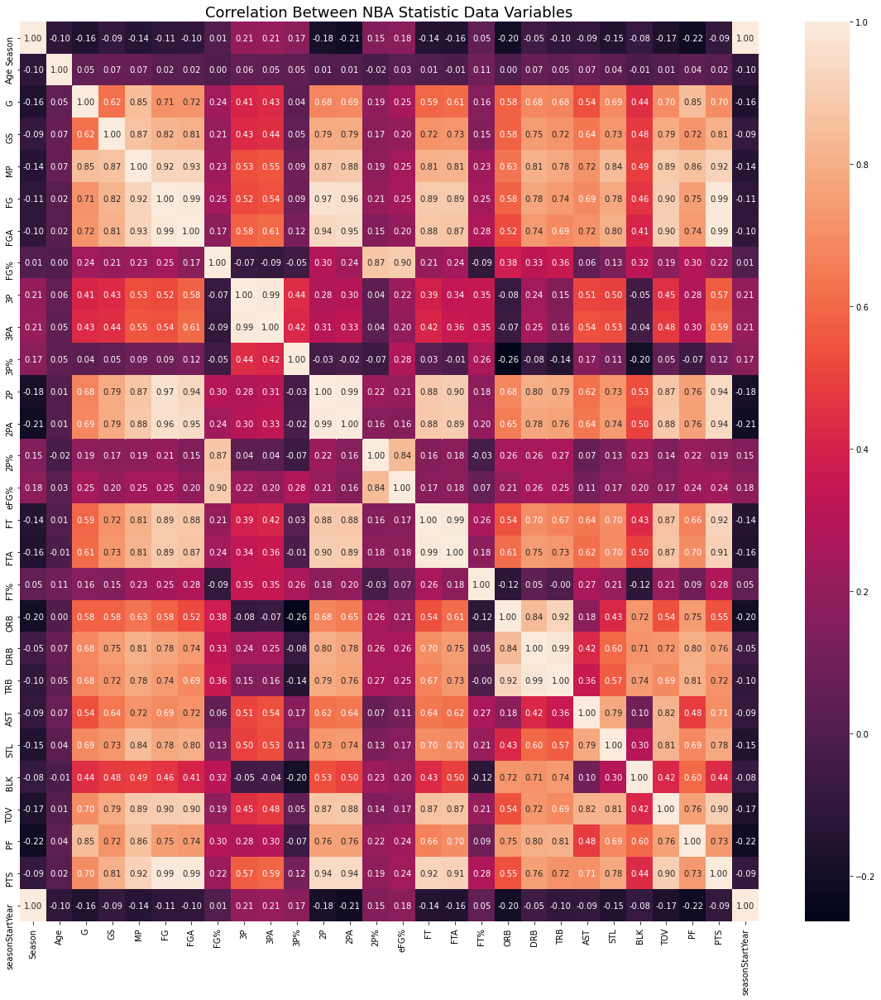

In [8]:
# create a heatmap of 
plt.figure(figsize=(20,20))
sns.heatmap(df_final.corr(),annot=True, fmt=".2f")
plt.title("Correlation Between NBA Statistic Data Variables",fontsize=18,color="BLACK")

In [9]:
# define x and y 
# Create a DataFrame holding the features (X)
df_X = pd.DataFrame(df_nonull, columns = ['Age', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%','3P', '3PA', '3P%','2P', '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS'])

# had to drop position, player name, and team because there's no way to make them numeric values
# See first 5 rows 
df_X.shape

# print the info about the x dataframe and check for null values
print(df_X.info)
print(df_X.isnull().values.any())

<bound method DataFrame.info of          Age     G    GS      MP     FG     FGA    FG%     3P    3PA    3P%  \
0       27.0  80.0  50.0  1691.0  138.0   285.0  0.484    3.0    4.0  0.750   
4       28.0  68.0   0.0  1313.0  109.0   214.0  0.509    1.0    3.0  0.333   
8       29.0  68.0   6.0   926.0   78.0   151.0  0.517    1.0    3.0  0.333   
18      27.0  79.0  74.0  2690.0  398.0   989.0  0.402  158.0  432.0  0.366   
25      28.0  66.0  66.0  2346.0  560.0  1421.0  0.394  167.0  564.0  0.296   
...      ...   ...   ...     ...    ...     ...    ...    ...    ...    ...   
156553  24.0  31.0   0.0   513.0   57.0   130.0  0.438   26.0   77.0  0.338   
156559  22.0  22.0   0.0    98.0   14.0    33.0  0.424    8.0   17.0  0.471   
156560  22.0  22.0   0.0    98.0   14.0    33.0  0.424    8.0   17.0  0.471   
156565  19.0  39.0  27.0   836.0  191.0   368.0  0.519   12.0   38.0  0.316   
156566  19.0  39.0  27.0   836.0  191.0   368.0  0.519   12.0   38.0  0.316   

        ...    FT% 

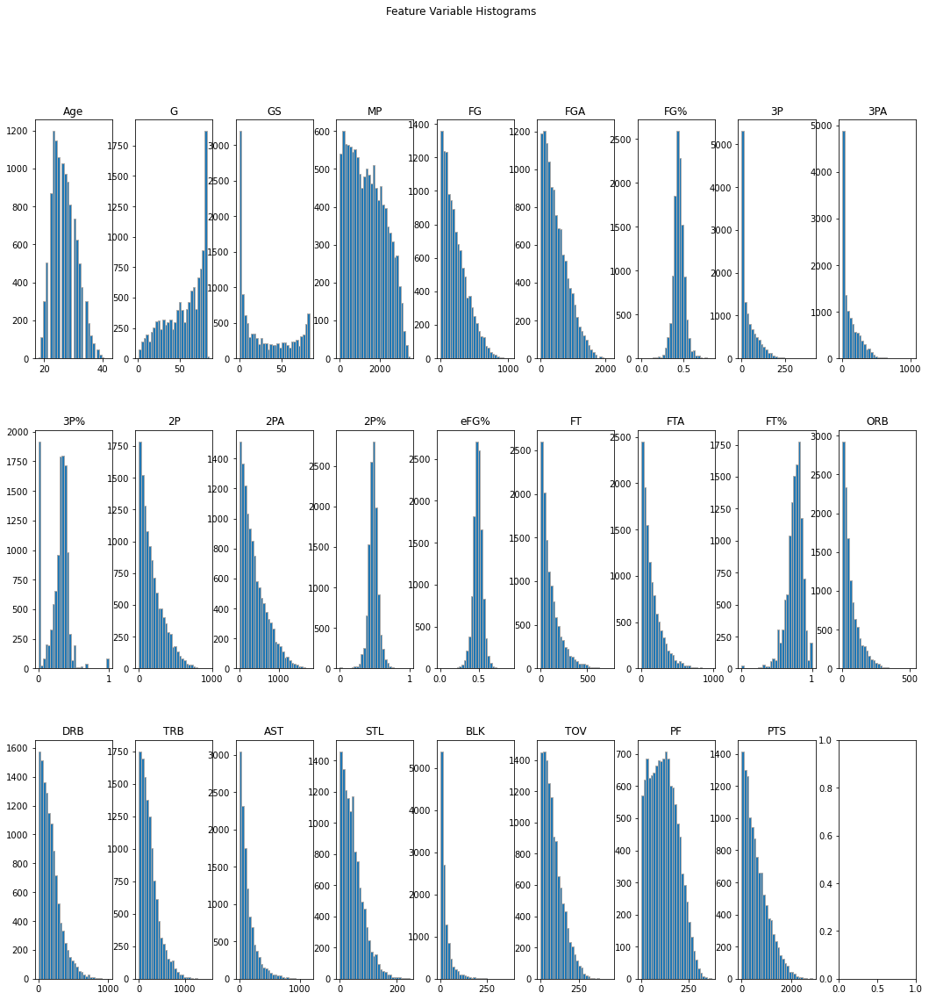

In [10]:
# create a histogram for each of the variables in x to understand the distribution of each
fig, axs = plt.subplots(3, 9, figsize=(18, 18))
df_X.hist(grid=False, ax=axs.flatten()[:-1], bins=30, edgecolor="darkgrey")
plt.suptitle("Feature Variable Histograms")
plt.show()

In [11]:
# Create a DataFrame holding the y variable for salary
df_y = pd.DataFrame(df_nonull, columns = ['inflationAdjSalary'])

# check the shape to make sure it matches the shape of df_x
df_y.shape

# check the 
print(df_y.info)
print(df_y.isnull().values.any())

<bound method DataFrame.info of        inflationAdjSalary
0                $996,827
4              $1,191,780
8                $528,371
18             $1,881,882
25             $2,851,993
...                   ...
156553         $2,442,066
156559           $504,542
156560           $504,542
156565         $9,997,289
156566         $9,997,289

[11926 rows x 1 columns]>
False


In [12]:
# df_y contains strings with dollar signs and commas. Let's change these to integer values before moving on
# change the salaries to an integer, remove the $'s and ,'s. 
df_y['inflationAdjSalary'] = df_y['inflationAdjSalary'].str.replace('$', '', regex=False).str.replace(',', '').astype(int)

# print the head of df_y to make sure this change worked
df_y.head()

# do not run this cell twice without running everything above first. It will try to replace the $ and , again

,inflationAdjSalary
0,996827
4,1191780
8,528371
18,1881882
25,2851993


In [13]:
df_y.shape
print(df_y.head(20))

     inflationAdjSalary
0                996827
4               1191780
8                528371
18              1881882
25              2851993
32              2766555
39              2686087
46              2482605
53              2409348
60              2543393
66              2684229
72              2855322
78              3326316
84              3084437
85              1653775
91              1579599
97              2810938
103             3467905
109             4164370
115             1140535


<Figure size 720x432 with 0 Axes>

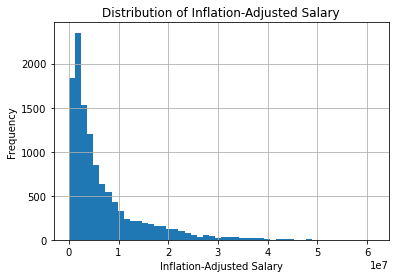

In [14]:
# create a histogram for df_y to see the salary distribution
plt.figure(figsize=(10, 6))
df_y.hist(column='inflationAdjSalary', bins=50)
plt.title('Distribution of Inflation-Adjusted Salary')
plt.xlabel('Inflation-Adjusted Salary')
plt.ylabel('Frequency')
plt.show()

In [15]:
# Split into 80% train and 20% test set. 
train_x, test_x, train_y, test_y = train_test_split(df_X, df_y, test_size = .2, random_state=2103)

# Print the shape of the trainining data 
print("Training data shape: ", train_x.shape, train_y.shape)

# Print the shape of the test set
print("Test data shape: ", test_x.shape, test_y.shape)

# Reset index of training data 
train_x.reset_index(inplace = True)
train_y.reset_index(inplace = True)

# Drop index column 
train_x = train_x.drop("index", axis = 1)
train_y = train_y.drop("index", axis = 1)

# Repeat for test set
test_x.reset_index(inplace = True)
test_y.reset_index(inplace = True)
test_x = test_x.drop("index", axis = 1)
test_y = test_y.drop("index", axis = 1)

Training data shape:  (9540, 26) (9540, 1)
Test data shape:  (2386, 26) (2386, 1)


In [16]:
# drop rows with missing values in train_x and train_y
train_x.dropna(inplace=True)
train_y.dropna(inplace=True)

# find the pearson correlation value for each of the variables in relation to the target variable "inflationAdjSalary"
train_x.corrwith(train_y['inflationAdjSalary'], method = 'pearson')

Age     0.191976
G       0.170347
GS      0.445701
MP      0.398329
FG      0.489978
FGA     0.483092
FG%     0.164331
3P      0.358762
3PA     0.367932
3P%     0.082713
2P      0.435865
2PA     0.421584
2P%     0.157168
eFG%    0.186188
FT      0.464862
FTA     0.457524
FT%     0.142478
ORB     0.226394
DRB     0.451937
TRB     0.397109
AST     0.360001
STL     0.308124
BLK     0.266138
TOV     0.423418
PF      0.249270
PTS     0.505496
dtype: float64

<Figure size 7200x7200 with 0 Axes>

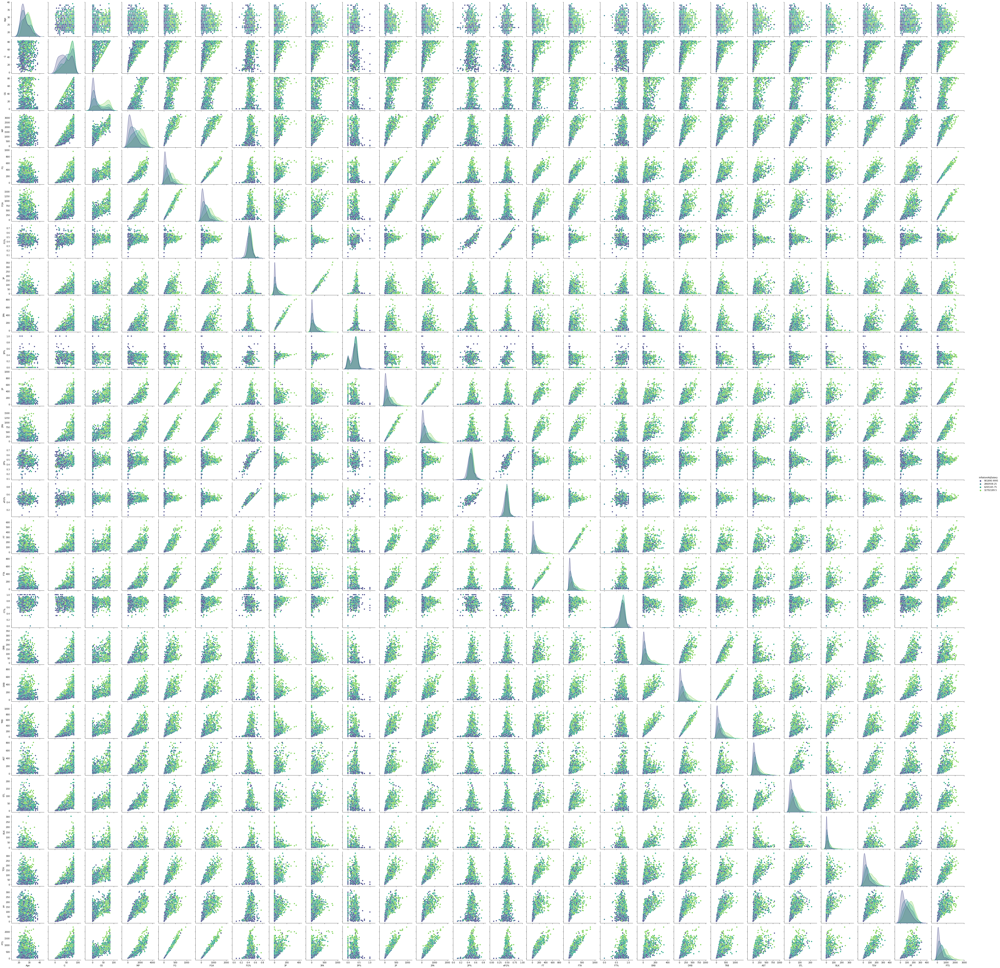

In [17]:
# create a new dataframe with both combined
dfs_combined = train_x.copy()
dfs_combined['inflationAdjSalary'] = train_y['inflationAdjSalary']

# create queartiles for a target variable and keep only the midpoint of the quartile
dfs_combined['inflationAdjSalary'] = pd.qcut(dfs_combined['inflationAdjSalary'], 4, retbins = False)
dfs_combined['inflationAdjSalary'] = dfs_combined['inflationAdjSalary'].apply(lambda x: x.mid)

# Select a subsample because a pairplot will take a very long time to load with the full training set
dfs_combined = dfs_combined.sample(1000, random_state = 2103)

# create the pairplot
plt.figure(figsize = (100, 100))
ax = sns.pairplot(data = dfs_combined, hue  = 'inflationAdjSalary', diag_kind = 'kde', palette = 'viridis')
plt.show()

In [18]:
# Descriptive statistics for features
print(train_x.describe())

               Age            G           GS           MP           FG  \
count  9540.000000  9540.000000  9540.000000  9540.000000  9540.000000   
mean     26.702830    55.157966    29.000734  1378.139308   220.556289   
std       4.063942    22.730440    29.100336   870.670260   175.383943   
min      18.000000     1.000000     0.000000     6.000000     0.000000   
25%      23.000000    38.000000     2.000000   620.000000    77.000000   
50%      26.000000    61.000000    18.000000  1316.500000   179.000000   
75%      30.000000    76.000000    56.000000  2071.000000   325.000000   
max      42.000000    85.000000    83.000000  3533.000000   992.000000   

               FGA          FG%           3P          3PA          3P%  ...  \
count  9540.000000  9540.000000  9540.000000  9540.000000  9540.000000  ...   
mean    484.092977     0.443332    39.339518   110.464675     0.281109  ...   
std     370.558564     0.065050    47.949279   125.575076     0.156212  ...   
min       2.00000

In [19]:
# Descriptive statistics for target
print(train_y.describe())

       inflationAdjSalary
count        9.540000e+03
mean         6.719392e+06
std          7.504209e+06
min          2.092400e+04
25%          1.782858e+06
50%          3.939018e+06
75%          8.591313e+06
max          5.699307e+07


In [20]:
# import kbest and the f_regression packages from sklearn
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
k_best = SelectKBest(score_func = f_regression, k = 26).fit(train_x, train_y["inflationAdjSalary"])
# create the features variable so that you can display only the selected features
features = k_best.get_support(indices = True)
train_x.iloc[:,features].head()

,Age,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,32.0,30.0,0.0,377.0,51.0,115.0,0.443,14.0,35.0,0.400,...,0.500,8.0,32.0,40.0,21.0,4.0,3.0,14.0,42.0,119.0
1,22.0,78.0,75.0,2832.0,393.0,1024.0,0.384,103.0,312.0,0.330,...,0.797,51.0,216.0,267.0,545.0,118.0,10.0,230.0,180.0,1093.0
2,24.0,49.0,0.0,642.0,121.0,246.0,0.492,23.0,49.0,0.469,...,0.787,37.0,121.0,158.0,20.0,18.0,13.0,27.0,63.0,302.0
3,25.0,18.0,13.0,593.0,111.0,303.0,0.366,44.0,137.0,0.321,...,0.771,16.0,51.0,67.0,129.0,31.0,4.0,38.0,52.0,340.0
4,27.0,56.0,7.0,1206.0,212.0,486.0,0.436,83.0,198.0,0.419,...,0.781,12.0,106.0,118.0,117.0,27.0,2.0,60.0,75.0,557.0


In [21]:
# Fit model
multivar_reg = LinearRegression(fit_intercept = True).fit(train_x.iloc[:, features], train_y["inflationAdjSalary"])

# Print coefficients of fitted model 
print(multivar_reg.coef_)
print(multivar_reg.intercept_)
print("Linear Regression Accuracy :", multivar_reg.score((test_x.iloc[:, features]), test_y))

[ 3.16450538e+05 -7.48659748e+04  4.48928653e+04 -4.37237639e+03
  5.22963954e+03  1.02710220e+04  3.37392866e+07 -6.18298913e+03
  2.09695813e+04  8.83659843e+04  1.14126287e+04 -1.06985593e+04
 -2.69902882e+06 -2.44446465e+07 -5.71833201e+03  1.50137875e+04
  1.79223864e+06 -1.83586878e+04  2.27841201e+04  4.42543228e+03
  1.13664019e+04 -2.05334424e+04  1.66763373e+04 -1.52566880e+04
 -7.30143788e+03 -1.44204209e+03]
-5710993.136111986
Linear Regression Accuracy : 0.43807195489640904


In [22]:
# Make prediction using the test set 
pred_y = multivar_reg.predict(test_x.iloc[:, features])

# Calculate MSE
mse_test = mean_squared_error(test_y, pred_y)
print(mse_test)

# Calculate RMSE
rmse_test = mean_squared_error(test_y, pred_y, squared = False)
print(rmse_test)

# Calcualte R2
r2_test = r2_score(test_y, pred_y)
print(r2_test)

31265392868771.34
5591546.554288119
0.43807195489640904


In [23]:
from sklearn.ensemble import RandomForestRegressor

# Fit the Random Forest model with the selected features
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(train_x.iloc[:, features], train_y["inflationAdjSalary"])

# Print feature importances of the fitted Random Forest model
print(rf_model.feature_importances_)

# Predict and print accuracy of the fitted Random Forest model
print("Random Forest Accuracy:", rf_model.score(test_x.iloc[:, features], test_y))


[0.0577506  0.10527898 0.10542985 0.03958508 0.01676529 0.01859478
 0.014669   0.0192458  0.02970991 0.01441653 0.01226073 0.01458265
 0.02287519 0.02926717 0.01861674 0.01788828 0.02540104 0.02178936
 0.05636285 0.01779719 0.03104994 0.01939882 0.02414347 0.02288122
 0.03413866 0.21010087]
Random Forest Accuracy: 0.5839224027600267


In [29]:
# create a new dataframe with data from 2010 and after
df_new = df_final[df_final['Season'] > 2009]
print(df_new.shape)

# define x and y 
# Create a DataFrame holding the features (X)
df_X_new = pd.DataFrame(df_new, columns = ['Age', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%','3P', '3PA', '3P%','2P', '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS'])

# had to drop position, player name, and team because there's no way to make them numeric values
# See first 5 rows 
df_X_new.shape

# print the info about the x dataframe and check for null values
print(df_X_new.info)
print(df_X_new.isnull().values.any())
df_X_new.dropna(inplace = True)
print(df_X_new.isnull().values.any())
df_X_new.shape

(5927, 33)
<bound method DataFrame.info of          Age     G    GS      MP     FG    FGA    FG%     3P    3PA    3P%  \
4660    29.0  67.0  15.0  1486.0  229.0  558.0  0.410   75.0  236.0  0.318   
4677    30.0  61.0  44.0  1683.0  240.0  520.0  0.462  102.0  254.0  0.402   
4694    31.0  55.0   3.0  1445.0  239.0  504.0  0.474   83.0  208.0  0.399   
4711    32.0  75.0   3.0  1943.0  276.0  624.0  0.442  128.0  299.0  0.428   
4728    33.0  82.0  61.0  2584.0  333.0  774.0  0.430  123.0  324.0  0.380   
...      ...   ...   ...     ...    ...    ...    ...    ...    ...    ...   
156553  24.0  31.0   0.0   513.0   57.0  130.0  0.438   26.0   77.0  0.338   
156559  22.0  22.0   0.0    98.0   14.0   33.0  0.424    8.0   17.0  0.471   
156560  22.0  22.0   0.0    98.0   14.0   33.0  0.424    8.0   17.0  0.471   
156565  19.0  39.0  27.0   836.0  191.0  368.0  0.519   12.0   38.0  0.316   
156566  19.0  39.0  27.0   836.0  191.0  368.0  0.519   12.0   38.0  0.316   

        ...    FT%  

(5269, 26)

In [25]:
# Create a DataFrame holding the y variable for salary
df_y_new = pd.DataFrame(df_new, columns = ['inflationAdjSalary'])

# check the shape to make sure it matches the shape of df_x
df_y_new.shape

# check the 
print(df_y_new.info)
print(df_y_new.isnull().values.any())

<bound method DataFrame.info of        inflationAdjSalary
4660          $14,358,415
4677           $4,922,720
4694           $4,842,147
4711           $3,806,928
4728           $3,729,637
...                   ...
156553         $2,442,066
156559           $504,542
156560           $504,542
156565         $9,997,289
156566         $9,997,289

[5927 rows x 1 columns]>
False


In [26]:
# df_y contains strings with dollar signs and commas. Let's change these to integer values before moving on
# change the salaries to an integer, remove the $'s and ,'s. 
df_y_new['inflationAdjSalary'] = df_y_new['inflationAdjSalary'].str.replace('$', '', regex=False).str.replace(',', '').astype(int)

# print the head of df_y to make sure this change worked
df_y_new.head()

# do not run this cell twice without running everything above first. It will try to replace the $ and , again

,inflationAdjSalary
4660,14358415
4677,4922720
4694,4842147
4711,3806928
4728,3729637


<Figure size 720x432 with 0 Axes>

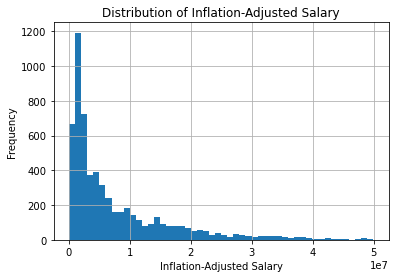

In [27]:
# create a histogram for df_y to see the salary distribution
plt.figure(figsize=(10, 6))
df_y_new.hist(column='inflationAdjSalary', bins=50)
plt.title('Distribution of Inflation-Adjusted Salary')
plt.xlabel('Inflation-Adjusted Salary')
plt.ylabel('Frequency')
plt.show()

In [35]:
# join the databases to take care of the different sizes
Joined2010 = pd.concat([df_X_new, df_y_new], axis = 1)
Joined2010.head()
Joined2010.shape
# 
Joined2010.dropna(inplace = True)
Joined2010.shape

X_2010 = pd.DataFrame(Joined2010, columns = ['Age', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%','3P', '3PA', '3P%','2P', '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS'])
Y_2010 = pd.DataFrame(Joined2010, columns = ['inflationAdjSalary'])
print(X_2010.shape)
Y_2010.shape

(5269, 26)


(5269, 1)

In [36]:
# Split into 80% train and 20% test set. 
train_x2010, test_x2010, train_y2010, test_y2010 = train_test_split(X_2010, Y_2010, test_size = .2, random_state=2103)

# Print the shape of the trainining data 
print("Training data shape: ", train_x2010.shape, train_y2010.shape)

# Print the shape of the test set
print("Test data shape: ", test_x2010.shape, test_y2010.shape)

# Reset index of training data 
train_x2010.reset_index(inplace = True)
train_y2010.reset_index(inplace = True)

# Drop index column 
train_x2010 = train_x2010.drop("index", axis = 1)
train_y2010 = train_y2010.drop("index", axis = 1)

# Repeat for test set
test_x2010.reset_index(inplace = True)
test_y2010.reset_index(inplace = True)
test_x2010 = test_x2010.drop("index", axis = 1)
test_y2010 = test_y2010.drop("index", axis = 1)

Training data shape:  (4215, 26) (4215, 1)
Test data shape:  (1054, 26) (1054, 1)


In [37]:
# Fit the Random Forest model with the selected features
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(train_x2010.iloc[:, features], train_y2010["inflationAdjSalary"])

# Print feature importances of the fitted Random Forest model
print(rf_model.feature_importances_)

# Predict and print accuracy of the fitted Random Forest model
print("Random Forest Accuracy:", rf_model.score(test_x2010.iloc[:, features], test_y2010))

[0.09470254 0.11325284 0.06155719 0.01937497 0.02602666 0.01267069
 0.01163596 0.01183391 0.0161638  0.01220268 0.0105554  0.01125724
 0.02259686 0.01967053 0.02638015 0.01869242 0.01955767 0.01304249
 0.02373867 0.01407885 0.0249598  0.01558326 0.01472794 0.01704854
 0.02388367 0.34480528]
Random Forest Accuracy: 0.6988895100900714
